<a href="https://colab.research.google.com/github/dnyandeobharambe/AI_Freelancing/blob/master/project3_objectdetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-t45rdmf_
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-t45rdmf_
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=263904 sha256=db61230b99ecfb71def2dbb63c4ab79a0746274fe86f8f08125e0ef2fa1e5140
  Stored in directory: /tmp/pip-ephem-wheel-cache-bvkfo2cw/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2


In [2]:
# for CUDA 10.1:
!python -m pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html
     |████████████████████████████████| 6.2MB 7.2MB/s 
     |████████████████████████████████| 81kB 5.5MB/s 
     |████████████████████████████████| 51kB 8.6MB/s 
     |████████████████████████████████| 112kB 43.5MB/s 
     |████████████████████████████████| 645kB 47.4MB/s 
  Created wheel for pycocotools: filename=pycocotools-2.0.2-cp37-cp37m-linux_x86_64.whl size=263972 sha256=795b1204fc32f4c0f7caa79704da50ce3a5a2e78646557b4e664f5d621a922dc
  Stored in directory: /root/.cache/pip/wheels/68/a5/e7/56401832f23d0b2db351c5b682e466cb4841960b086da65e4e
  Created wheel for fvcore: filename=fvcore-0.1.3.post20210317-cp37-none-any.whl size=58543 sha256=fe14ff9d688c3c955896fbf87a508b1694f04ac3e921fa70e752cb7ef50206ec
  Stored in directory: /root/.cache/pip/wheels/d2/ee/3a/5c531df777c03d8c67f22c65f97d6f75321087482d05a9b218
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-cp37-none-a

In [3]:
!wget https://www.dropbox.com/s/k81ljpmzy3fgtx9/datset.zip?dl=1

--2021-06-17 02:15:19--  https://www.dropbox.com/s/k81ljpmzy3fgtx9/datset.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/dl/k81ljpmzy3fgtx9/datset.zip [following]
--2021-06-17 02:15:19--  https://www.dropbox.com/s/dl/k81ljpmzy3fgtx9/datset.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc749612ab0f86251cd6effbde4b.dl.dropboxusercontent.com/cd/0/get/BQlRHHE9wBa6p_ExaGroiC5mbspMaaqNswPGLS7vN5DyznCz2FWcyRT2Wr_N095niDZbbh7VIH5-phdLhYPN3PmGzzYVHS2Owt0wevtp6CarbiqaW1Kh5hgPsJnYcYqzP_RN8COkA3CDh9kydQ0YbF1S/file?dl=1# [following]
--2021-06-17 02:15:19--  https://uc749612ab0f86251cd6effbde4b.dl.dropboxusercontent.com/cd/0/get/BQlRHHE9wBa6p_ExaGroiC5mbspMaaqNswPGLS7vN5DyznCz2FWcyRT2Wr_N095niDZbbh7VIH5-phdLhYPN3PmGzzYVHS

In [4]:
!unzip datset.zip?dl=1

Streaming output truncated to the last 5000 lines.
 extracting: Dataset/train/Vehicle registration plate/Label/e933c80e4c4163ac.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/d63c2154f0185e71.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/caa032f8a90b3765.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/01074445420897a5.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/848b549c8ab1ca8a.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/a7a8777854872de6.txt  
 extracting: Dataset/train/Vehicle registration plate/Label/2a1faf064d58eb69.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/f6c54b84a51c77d6.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/8f0ca5d1d769fb4f.txt  
 extracting: Dataset/train/Vehicle registration plate/Label/36e1293915bb2033.txt  
  inflating: Dataset/train/Vehicle registration plate/Label/b1f0a348bfac8c1f.txt  
  inflating: Dataset/train/Vehicle r

In [5]:
%matplotlib inline

In [6]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
import os
import matplotlib.pyplot as plt

# model_zoo has lots of pre-trained models
from detectron2 import model_zoo

# DefaultTrainer is a class for training object detector
from detectron2.engine import DefaultTrainer
# DefaultPredictor is class for inference
from detectron2.engine import DefaultPredictor

# detectron2 has its configuration format
from detectron2.config import get_cfg
# detectron2 has implemented Visualizer of object detection
from detectron2.utils.visualizer import Visualizer

# from DatasetCatalog, detectron2 gets dataset and from MetadatCatalog it gets metadata of the dataset
from detectron2.data import DatasetCatalog, MetadataCatalog

# BoxMode supports bounding boxes in different format
from detectron2.structures import BoxMode

# COCOEvaluator based on COCO evaluation metric, inference_on_dataset is used for evaluation for a given metric
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# build_detection_test_loader, used to create test loader for evaluation
from detectron2.data import build_detection_test_loader

In [7]:
 #dataset_path = "Dataset/train/Vehicle registration plate"
 def get_train_test_imgs(dataset_path):
   img_path_list = []
   arr_txt = [x for x in os.listdir(dataset_path) if x.endswith(".jpg")]
   for image_filename in arr_txt:
     image_path = os.path.join(dataset_path, image_filename)
     img_path_list.append(image_path)
   return img_path_list
     #print(image_path)
        

 
 

In [8]:
# Testing
train_dataset_path = "Dataset/train/Vehicle registration plate"
train_img_list = get_train_test_imgs(train_dataset_path)
print(len(get_train_test_imgs(train_dataset_path)))
print(len(train_img_list))
print(train_img_list[0])

validation_dataset_path = "Dataset/validation/Vehicle registration plate"
validation_img_list = get_train_test_imgs(validation_dataset_path)
#for idx, filename in enumerate(validation_img_list):
  #print(idx)
  #print(filename)
print(len(validation_img_list))
print(validation_img_list[0])





5308
5308
Dataset/train/Vehicle registration plate/54c8d0e8cda8ef28.jpg
386
Dataset/validation/Vehicle registration plate/02a6ef3d9bd68e91.jpg


In [9]:
# write a function that loads the dataset into detectron2's standard format
def get_registration_plate_dicts(data_root):
    dataset_dicts = []
    filenames = []
    #csv_path = os.path.join(data_root, txt_file)
    #with open(csv_path, "r") as f:
        #for line in f:
            #filenames.append(line.rstrip())

    arr_txt = [x for x in os.listdir(data_root) if x.endswith(".jpg")]
    for image_filename in arr_txt:
      image_path = os.path.join(data_root, image_filename)
      filenames.append(image_path)
      

    for idx, filename in enumerate(filenames):
        record = {}
        
        #image_path = os.path.join(data_root, filename)
        image_path = filename
        
        height, width = cv2.imread(image_path).shape[:2]
        
        record['file_name'] = image_path
        record['image_id'] = idx
        record['height'] = height
        record['width'] = width
        
        image_filename = os.path.basename(filename)
        image_name = os.path.splitext(image_filename)[0]
        annotation_path = os.path.join(data_root, 'Label', '{}.txt'.format(image_name))
        annotation_rows = []

        with open(annotation_path, "r") as f:
            for line in f:
                temp = line.rstrip().split(" ")
                annotation_rows.append(temp)

        objs = []
        for row in annotation_rows:
            #xcentre = int(float(row[1])*width)
            #ycentre = int(float(row[2])*height)
            #bwidth = int(float(row[3])*width)
            #bheight = int(float(row[4])*height)
            
            #xmin = int(xcentre - bwidth/2)
            #ymin = int(ycentre - bheight/2)
            #xmax = xmin  + bwidth
            #ymax = ymin + bheight

            xmin = int(float(row[3]))
            ymin = int(float(row[4]))
            xmax = int(float(row[5]))
            ymax = int(float(row[6]))
    
            obj= {
                'bbox': [xmin, ymin, xmax, ymax],
                'bbox_mode': BoxMode.XYXY_ABS,
                # alternatively, we can use bbox_mode = BoxMode.XYWH_ABS
                # 'bbox': [xmin, ymin, bwidth, bheight],
                # 'bbox_mode': BoxMode.XYWH_ABS,
                'category_id': 0,
                'iscrowd': 0
            }
        
            objs.append(obj)
        record['annotations'] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [10]:
data_root_test = 'Dataset/validation/Vehicle registration plate'
dicts = get_registration_plate_dicts(data_root_test)
#print(dicts)
print(len(dicts))

data_root_test = 'Dataset/train/Vehicle registration plate'
dicts = get_registration_plate_dicts(data_root_test)
#print(dicts)
print(len(dicts))

386
5308


In [11]:
# configurations

data_root_test = 'Dataset/validation/Vehicle registration plate'
data_root_train = 'Dataset/train/Vehicle registration plate'

train_data_name = 'Vehicle_registration_plate_train'
test_data_name = 'Vehicle_registration_plate_test'

thing_classes = ['Vehicle-registration-plate']

output_dir = 'outputs'



#def count_lines(fname):
    #with open(fname) as f:
        #for i, l in enumerate(f):
            #pass
    #return i + 1

#train_img_count = count_lines(os.path.join(data_root, train_txt))

train_img_count = len(get_train_test_imgs(train_dataset_path))

In [12]:
# register train data
DatasetCatalog.register(name=train_data_name, 
                        func=lambda: get_registration_plate_dicts(data_root_train))
train_metadata = MetadataCatalog.get(train_data_name).set(thing_classes=thing_classes)

# register test data
DatasetCatalog.register(name=test_data_name, 
                        func=lambda: get_registration_plate_dicts(data_root_test))
test_metadata = MetadataCatalog.get(test_data_name).set(thing_classes=thing_classes)

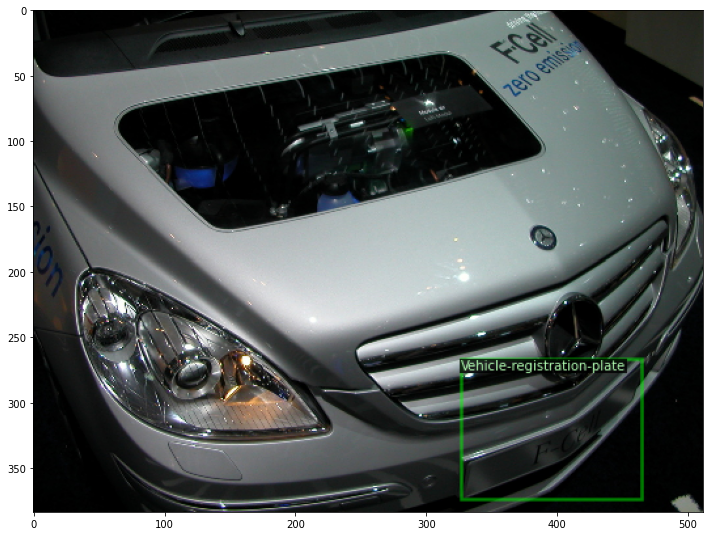

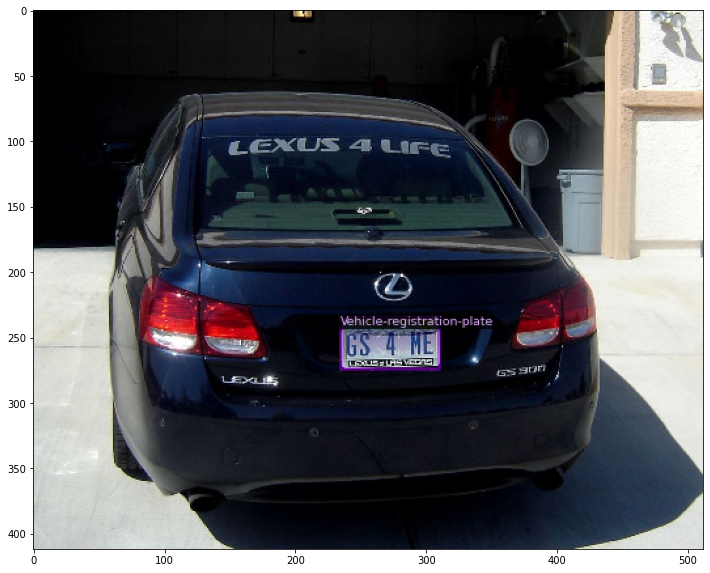

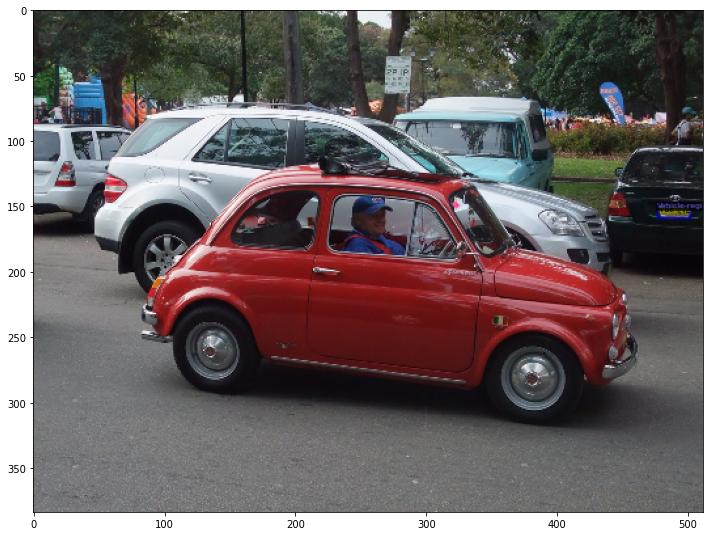

In [13]:
test_data_dict = get_registration_plate_dicts(data_root_test)

for d in random.sample(test_data_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], 
                            metadata=test_metadata, 
                            scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (12, 12))
    plt.imshow(vis.get_image())
    plt.show()

In [14]:

# default configuration
cfg = get_cfg()

# update configuration with RetinaNet configuration
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))

# We have registered the train and test data set with name traffic_sign_train and traffic_sign_test. 
# Let's replace the detectron2 default train dataset with our train dataset.
cfg.DATASETS.TRAIN = (train_data_name,)

# No metric implemented for the test dataset, we will have to update cfg.DATASET.TEST with empty tuple
cfg.DATASETS.TEST = ()

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


In [15]:
# data loader configuration
cfg.DATALOADER.NUM_WORKERS = 4
# Update model URL in detectron2 config file
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

# batch size
cfg.SOLVER.IMS_PER_BATCH = 4
#cfg.SOLVER.IMS_PER_BATCH = 8

# choose a good learning rate
cfg.SOLVER.BASE_LR = 0.0001

# We need to specify the number of iteration for training in detectron2, not the number of epochs.
# lets convert number of epoch to number or iteration (max iteration)

epoch = 4
max_iter = int(epoch * train_img_count / cfg.SOLVER.IMS_PER_BATCH)
#max_iter = 1500

cfg.SOLVER.MAX_ITER = max_iter

In [16]:
# number of output class
# we have only one class that is Traffic Sign
cfg.MODEL.RETINANET.NUM_CLASSES = len(thing_classes)

# update create ouptput directory 
cfg.OUTPUT_DIR = output_dir
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [17]:
# training

# Create a trainer instance with the configuration.
trainer = DefaultTrainer(cfg) 

# if resume=False, because we don't have trained model yet. It will download model from model url and load it
trainer.resume_or_load(resume=False)

# start training
trainer.train()

[06/17 02:17:50 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
model_final_5bd44e.pkl: 152MB [00:03, 42.6MB/s]                           
Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (9, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.


[06/17 02:18:58 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[06/17 02:19:26 d2.utils.events]:  eta: 2:05:57  iter: 19  total_loss: 1.548  loss_cls: 1.072  loss_box_reg: 0.5343  time: 1.3836  data_time: 0.0469  lr: 1.9981e-06  max_mem: 3968M
[06/17 02:19:44 d2.utils.events]:  eta: 1:39:48  iter: 39  total_loss: 1.511  loss_cls: 1.007  loss_box_reg: 0.545  time: 1.1352  data_time: 0.0236  lr: 3.9961e-06  max_mem: 3968M
[06/17 02:20:02 d2.utils.events]:  eta: 1:22:57  iter: 59  total_loss: 1.526  loss_cls: 1.044  loss_box_reg: 0.4812  time: 1.0492  data_time: 0.0255  lr: 5.9941e-06  max_mem: 3968M
[06/17 02:20:20 d2.utils.events]:  eta: 1:22:27  iter: 79  total_loss: 1.4  loss_cls: 0.9819  loss_box_reg: 0.4446  time: 1.0200  data_time: 0.0231  lr: 7.9921e-06  max_mem: 3968M
[06/17 02:20:39 d2.utils.events]:  eta: 1:21:59  iter: 99  total_loss: 1.695  loss_cls: 1.136  loss_box_reg: 0.6456  time: 1.0034  data_time: 0.0208  lr: 9.9901e-06  max_mem: 3968M
[06/17 02:20:58 d2.utils.events]:  eta: 1:21:44  iter: 119  total_loss: 1.383  loss_cls: 0.9557  

In [18]:
# inference on our fine-tuned model

# By default detectron2 save the model with name model_final.pth
# update the model path in configuration that will be used to load the model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")


# update RetinaNet score threshold 
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5

cfg.DATASETS.TEST = (test_data_name,)

# create a predictor instance with the configuration (it has our fine-tuned model)
# this predictor does prdiction on a single image
predictor = DefaultPredictor(cfg)

Dataset/validation/Vehicle registration plate/53386dae3cf13cc3.jpg
{'instances': Instances(num_instances=1, image_height=768, image_width=1024, fields=[pred_boxes: Boxes(tensor([[273.5145, 485.3445, 608.1923, 584.0229]], device='cuda:0')), scores: tensor([0.7230], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


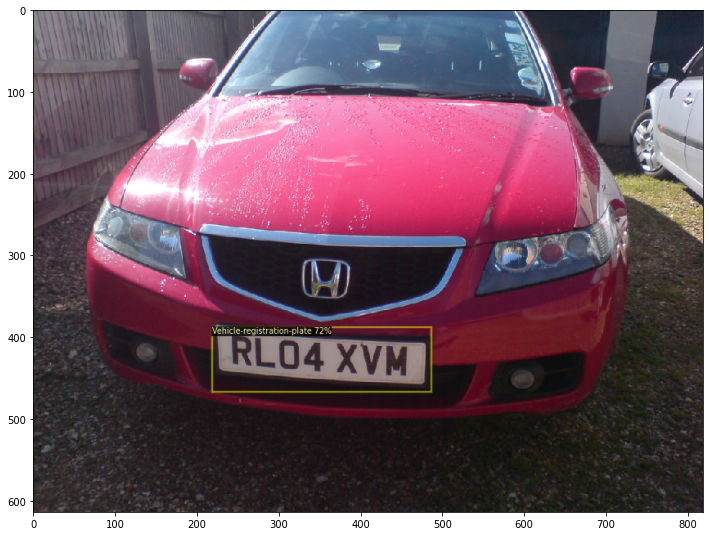

Dataset/validation/Vehicle registration plate/06b024413ad385a7.jpg
{'instances': Instances(num_instances=1, image_height=773, image_width=1024, fields=[pred_boxes: Boxes(tensor([[835.9274, 483.3182, 917.4069, 523.1519]], device='cuda:0')), scores: tensor([0.8600], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


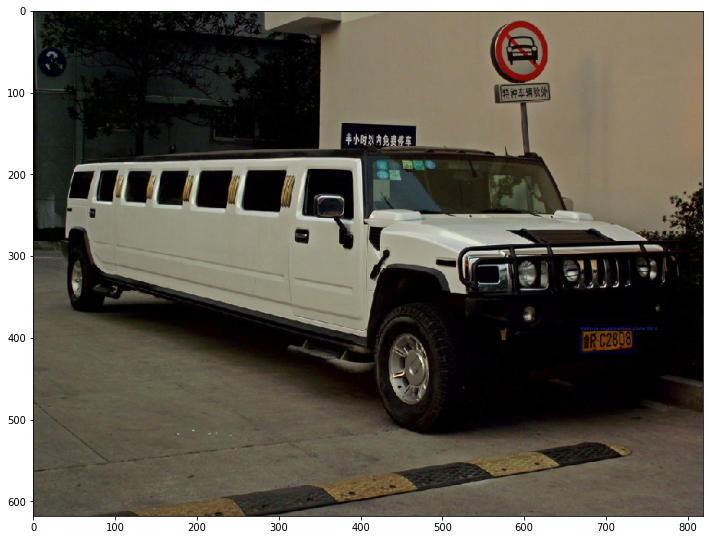

Dataset/validation/Vehicle registration plate/2956bcbedfc167b6.jpg
{'instances': Instances(num_instances=2, image_height=768, image_width=1024, fields=[pred_boxes: Boxes(tensor([[890.9651, 379.7239, 938.3665, 425.6215],
        [946.9486, 273.5814, 972.5674, 298.2175]], device='cuda:0')), scores: tensor([0.8512, 0.6025], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


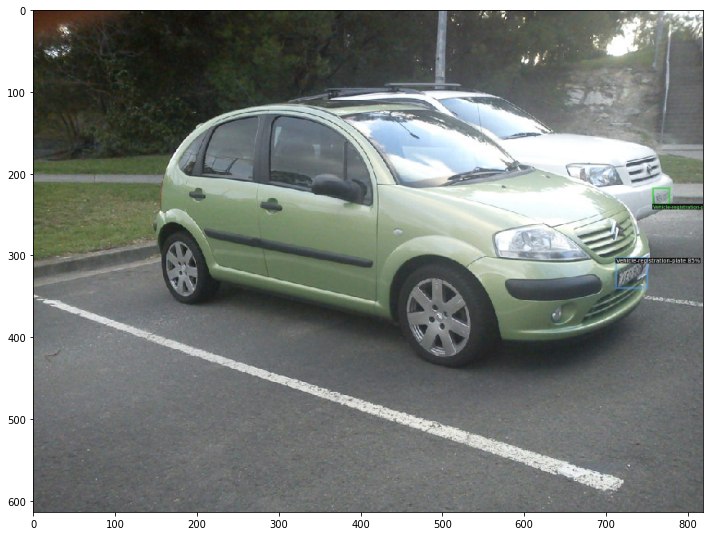

In [19]:
# let's have a look on prediction

for d in random.sample(test_data_dict, 3):
    print(d["file_name"])
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata, 
                   scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (12, 12))
    plt.imshow(v.get_image())
    plt.show()

In [20]:

%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir outputs

<IPython.core.display.Javascript object>

In [21]:
# create directory for evaluation
eval_dir = os.path.join(cfg.OUTPUT_DIR, 'coco_eval')
os.makedirs(eval_dir, exist_ok=True)

# create evaluator instance with coco evaluator
evaluator = COCOEvaluator(dataset_name=test_data_name, 
                          tasks=cfg, 
                          distributed=False, 
                          output_dir=eval_dir)

# create validation data loader
val_loader = build_detection_test_loader(cfg, test_data_name)

# start validation
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [06/17 03:42:47 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[06/17 03:42:47 d2.evaluation.coco_evaluation]: 'Vehicle_registration_plate_test' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[06/17 03:42:47 d2.data.datasets.coco]: Converting annotations of dataset 'Vehicle_registration_plate_test' to COCO format ...)
[06/17 03:42:52 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[06/17 03:42:52 d2.data.datasets.coco]: Conversion finished, #images: 386, #annotations: 512
[06/17 03:42:52 d2.data.datasets.coco]: Caching COCO format annotations at 'outputs/coco_eval/Vehicle_registration_plate_test_coco_format.json' ...
[06/17 03:42:57 d2.data.build]: Distribution of instances among all 1 categories:
|   category    | #instances   |
|:-------------:|:-------------|
| Vehicle-reg.. | 512          |
|               | 

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[06/17 03:42:59 d2.evaluation.evaluator]: Inference done 11/386. 0.1000 s / img. ETA=0:00:37
[06/17 03:43:04 d2.evaluation.evaluator]: Inference done 61/386. 0.0992 s / img. ETA=0:00:32
[06/17 03:43:09 d2.evaluation.evaluator]: Inference done 110/386. 0.0992 s / img. ETA=0:00:28
[06/17 03:43:14 d2.evaluation.evaluator]: Inference done 159/386. 0.0996 s / img. ETA=0:00:23
[06/17 03:43:19 d2.evaluation.evaluator]: Inference done 205/386. 0.1004 s / img. ETA=0:00:18
[06/17 03:43:24 d2.evaluation.evaluator]: Inference done 253/386. 0.1009 s / img. ETA=0:00:13
[06/17 03:43:29 d2.evaluation.evaluator]: Inference done 301/386. 0.1011 s / img. ETA=0:00:08
[06/17 03:43:34 d2.evaluation.evaluator]: Inference done 348/386. 0.1016 s / img. ETA=0:00:03
[06/17 03:43:38 d2.evaluation.evaluator]: Total inference time: 0:00:40.056930 (0.105136 s / img per device, on 1 devices)
[06/17 03:43:38 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:38 (0.101739 s / img per device, on 1 devices

OrderedDict([('bbox',
              {'AP': 58.90297182024128,
               'AP50': 87.34197842008643,
               'AP75': 66.47454081724862,
               'APl': 67.90057173755395,
               'APm': 68.97225734643285,
               'APs': 26.5983844777908})])

In [22]:
!wget https://www.dropbox.com/s/g88o4dx18zpgn8k/proj3-input-video.mp4?dl=1

--2021-06-17 03:43:38--  https://www.dropbox.com/s/g88o4dx18zpgn8k/proj3-input-video.mp4?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/dl/g88o4dx18zpgn8k/proj3-input-video.mp4 [following]
--2021-06-17 03:43:39--  https://www.dropbox.com/s/dl/g88o4dx18zpgn8k/proj3-input-video.mp4
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc816a1ce1e3817f8cf4b542c033.dl.dropboxusercontent.com/cd/0/get/BQlZSSIML0fLbrWUoiLRw1BUknmjRSX3NUFHiAMCTDVXgzbAiwdMjblWeQN4wvsgkk_KGru4smnRvKiZXERtnLer2An3vvVXy9m49ARvT0ThJKz1_iwpBxhHkcxY4DE31sSfrv23G-ZrnU_ygwHJgUe_/file?dl=1# [following]
--2021-06-17 03:43:39--  https://uc816a1ce1e3817f8cf4b542c033.dl.dropboxusercontent.com/cd/0/get/BQlZSSIML0fLbrWUoiLRw1BUknmjRSX3NUFHiAMCTDVXgzbAiwdMjblWeQN4w

In [23]:
def video_read_write(video_path):
    """
    Read video frames one-by-one, flip it, and write in the other video.
    video_path (str): path/to/video
    """
    video = cv2.VideoCapture(video_path)
    
    # Check if camera opened successfully
    if not video.isOpened(): 
        print("Error opening video file")
        return
    
    # create video writer
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    
    output_fname = '{}_out.avi'.format(os.path.splitext(video_path)[0])
    
    
    
    output_file = cv2.VideoWriter(
        filename=output_fname,
        # some installation of opencv may not support x264 (due to its license),
        # you can try other format (e.g. MPEG)
        #fourcc=cv2.VideoWriter_fourcc(*"x264"),
        fourcc=cv2.VideoWriter_fourcc(*"MJPG"),
        #fps=float(frames_per_second),
        fps=frames_per_second,
        frameSize=(width, height),
        isColor=True,
    )
    
        
    i = 0
    while video.isOpened():
        ret, frame = video.read()
        if ret:
            
            #output_file.write(frame[:, ::-1, :])
            #plt.imshow(frame)
            #plt.show()
            outputs = predictor(frame)
            #print(outputs)
            v = Visualizer(frame,
                   metadata=None, 
                   scale=0.8
            )
            v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
            #output_file.write(predictor(frame[:, ::-1, :]))
            #plt.imshow(v.get_image())
            #plt.show()
            img = cv2.resize(v.get_image(),(width,height))
            output_file.write(img)
            #output_file.write(v.get_image())
#             cv2.imwrite('anpd_out/frame_{}.png'.format(str(i).zfill(3)), frame[:, ::-1, :])
            i += 1
        else:
            break
        
    video.release()
    output_file.release()
    
    return

In [24]:
video_read_write('proj3-input-video.mp4?dl=1')

# New Section